In [1]:
!pip install -q ultralytics==8.4.115

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 59.8 MB/s eta 0:00:00


In [2]:
import os
import shutil
import random
import time
import yaml
import torch
import ultralytics

from pathlib import Path
from collections import Counter
from ultralytics import YOLO

print("Ultralytics:", ultralytics.__version__)
print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics: 8.4.115
PyTorch: 2.10.0+cu128
CUDA available: True
GPU: Tesla T4


In [3]:
from pathlib import Path

SOURCE_DATASET = Path(
    "/kaggle/input/datasets/chentaojie/"
    "team16-rock-size-detection-dataset/"
    "3Typesfield-rock-detection.yolov8"
)

print("Dataset exists:", SOURCE_DATASET.exists())

for split in ["train", "valid", "test"]:
    print(
        split,
        "images:",
        (SOURCE_DATASET / split / "images").exists(),
        "labels:",
        (SOURCE_DATASET / split / "labels").exists()
    )

print("YAML:", (SOURCE_DATASET / "data.yaml").exists())

Dataset exists: True
train images: True labels: True
valid images: True labels: True
test images: True labels: True
YAML: True


In [4]:
with open(SOURCE_DATASET / "data.yaml", "r") as f:
    config = yaml.safe_load(f)

print(config)
print("Classes:", config["names"])

{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 3, 'names': ['LargeRock', 'MediumRock', 'SmallRock'], 'roboflow': {'workspace': 'taojies-workspace', 'project': 'field-rock-detection', 'version': 'dataset', 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/taojies-workspace/field-rock-detection/dataset/dataset'}}
Classes: ['LargeRock', 'MediumRock', 'SmallRock']


In [5]:
!du -sh /kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8
!df -h /kaggle/working

7.0G	/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8
Filesystem      Size  Used Avail Use% Mounted on
/dev/loop1       20G  192K   20G   1% /kaggle/working


In [6]:
WORK_DATASET = Path(
    "/kaggle/working/rock_dataset_clean"
)

if WORK_DATASET.exists():
    shutil.rmtree(WORK_DATASET)

print("Copying dataset...")

shutil.copytree(
    SOURCE_DATASET,
    WORK_DATASET
)

print("Finished.")
print(WORK_DATASET)

Copying dataset...
Finished.
/kaggle/working/rock_dataset_clean


In [7]:
IMAGE_EXTS = {
    ".jpg", ".jpeg", ".png",
    ".bmp", ".webp"
}

for split in ["train", "valid", "test"]:

    image_dir = WORK_DATASET / split / "images"
    label_dir = WORK_DATASET / split / "labels"

    images = [
        p for p in image_dir.iterdir()
        if p.suffix.lower() in IMAGE_EXTS
    ]

    labels = list(label_dir.glob("*.txt"))

    print(
        f"{split}: "
        f"{len(images)} images, "
        f"{len(labels)} label files"
    )

train: 934 images, 934 label files
valid: 268 images, 268 label files
test: 132 images, 132 label files


In [8]:
bbox_count = 0
polygon_count = 0
bad_count = 0

examples = []

for split in ["train", "valid", "test"]:

    labels_dir = WORK_DATASET / split / "labels"

    for label_file in labels_dir.glob("*.txt"):

        for line_no, line in enumerate(
            label_file.read_text().splitlines(),
            start=1
        ):

            parts = line.strip().split()

            if not parts:
                continue

            values = parts[1:]

            if len(values) == 4:
                bbox_count += 1

            elif (
                len(values) >= 6
                and len(values) % 2 == 0
            ):
                polygon_count += 1

                if len(examples) < 10:
                    examples.append(
                        (
                            split,
                            label_file.name,
                            line_no,
                            len(parts)
                        )
                    )

            else:
                bad_count += 1

print("Bounding boxes:", bbox_count)
print("Polygon annotations:", polygon_count)
print("Invalid annotations:", bad_count)

print("\nPolygon examples:")
for x in examples:
    print(x)

Bounding boxes: 1091
Polygon annotations: 985
Invalid annotations: 0

Polygon examples:
('train', 'ChatGPT Image 2026年6月18日 19_53_14 (10)_png.rf.llhlHU3r6UjGLr28hOqz.txt', 1, 47)
('train', 'ChatGPT Image 2026年6月19日 12_02_28 (10)_png.rf.bamb5wIO1WbHjmQIoiNo.txt', 1, 29)
('train', 'ChatGPT Image 2026年6月20日 16_09_05 (5)_png.rf.wR5zPAzTbr6ho26neYKg.txt', 1, 37)
('train', 'Mz_June_2025 (50)_JPG.rf.vC77a8P4WELcpzRCOSOA.txt', 1, 85)
('train', 'field_stone_10_png.rf.dqryfxCTEYVsZZkLFTIR.txt', 1, 29)
('train', 'ChatGPT Image 2026年6月19日 12_10_50 (3)_png.rf.m96IRIUaSJdWknneg2KW.txt', 1, 35)
('train', 'ChatGPT Image 2026年6月21日 16_45_52 (5)_png.rf.nOF9YscxoHCmxNjEFQmK.txt', 1, 55)
('train', '20250516_094713_jpg.rf.OQsFQaUpqmq7d47OBQAQ.txt', 1, 213)
('train', '20250520_140050_jpg.rf.Q7PXqZW7iZUXIYsx4qJG.txt', 1, 209)
('train', 'ChatGPT Image 2026年6月20日 18_11_40 (3)_png.rf.jZ7wAkPZos9YCtuP2X8B.txt', 1, 35)


In [9]:
from pathlib import Path

converted = 0
kept_boxes = 0
invalid = []

for split in ["train", "valid", "test"]:

    labels_dir = WORK_DATASET / split / "labels"

    for label_file in labels_dir.glob("*.txt"):

        new_lines = []

        for line_no, line in enumerate(
            label_file.read_text().splitlines(),
            start=1
        ):

            parts = line.strip().split()

            if not parts:
                continue

            try:
                class_id = int(float(parts[0]))
                coords = list(map(float, parts[1:]))

                # -------------------------
                # Case 1: 已经是标准 bbox
                # class xc yc w h
                # -------------------------
                if len(coords) == 4:

                    xc, yc, w, h = coords

                    new_lines.append(
                        f"{class_id} "
                        f"{xc:.6f} "
                        f"{yc:.6f} "
                        f"{w:.6f} "
                        f"{h:.6f}"
                    )

                    kept_boxes += 1

                # -------------------------
                # Case 2: Polygon
                # class x1 y1 x2 y2 ...
                # -------------------------
                elif (
                    len(coords) >= 6
                    and len(coords) % 2 == 0
                ):

                    xs = coords[0::2]
                    ys = coords[1::2]

                    xmin = min(xs)
                    xmax = max(xs)

                    ymin = min(ys)
                    ymax = max(ys)

                    # polygon 外接矩形
                    xc = (xmin + xmax) / 2
                    yc = (ymin + ymax) / 2

                    w = xmax - xmin
                    h = ymax - ymin

                    new_lines.append(
                        f"{class_id} "
                        f"{xc:.6f} "
                        f"{yc:.6f} "
                        f"{w:.6f} "
                        f"{h:.6f}"
                    )

                    converted += 1

                else:

                    invalid.append(
                        (
                            split,
                            label_file.name,
                            line_no,
                            len(coords),
                            "Unsupported annotation format"
                        )
                    )

            except Exception as e:

                invalid.append(
                    (
                        split,
                        label_file.name,
                        line_no,
                        str(e)
                    )
                )

        # 覆盖 working copy 中的标签
        label_file.write_text(
            "\n".join(new_lines)
        )

print("Existing bbox kept:", kept_boxes)
print("Polygon converted:", converted)
print("Invalid:", len(invalid))

if invalid:
    print("\nInvalid examples:")
    for item in invalid[:20]:
        print(item)

Existing bbox kept: 1091
Polygon converted: 985
Invalid: 0


In [10]:
class_counts = Counter()
invalid_labels = []

for split in ["train", "valid", "test"]:

    labels_dir = WORK_DATASET / split / "labels"

    for label_file in labels_dir.glob("*.txt"):

        for line_no, line in enumerate(
            label_file.read_text().splitlines(),
            start=1
        ):

            parts = line.strip().split()

            if not parts:
                continue

            # Detection 必须正好 5 列
            if len(parts) != 5:
                invalid_labels.append(
                    (
                        split,
                        label_file.name,
                        line_no,
                        "not 5 columns"
                    )
                )
                continue

            try:

                class_id = int(parts[0])
                xc, yc, w, h = map(
                    float,
                    parts[1:]
                )

                if class_id not in [0, 1, 2]:
                    invalid_labels.append(
                        (
                            split,
                            label_file.name,
                            line_no,
                            "invalid class"
                        )
                    )
                    continue

                if not all(
                    0 <= x <= 1
                    for x in [xc, yc, w, h]
                ):
                    invalid_labels.append(
                        (
                            split,
                            label_file.name,
                            line_no,
                            "coordinate outside 0-1"
                        )
                    )
                    continue

                if w <= 0 or h <= 0:
                    invalid_labels.append(
                        (
                            split,
                            label_file.name,
                            line_no,
                            "invalid width/height"
                        )
                    )
                    continue

                class_counts[
                    (split, class_id)
                ] += 1

            except Exception as e:

                invalid_labels.append(
                    (
                        split,
                        label_file.name,
                        line_no,
                        str(e)
                    )
                )

print(
    "Invalid label lines:",
    len(invalid_labels)
)

for x in invalid_labels[:20]:
    print(x)

names = [
    "LargeRock",
    "MediumRock",
    "SmallRock"
]

for split in [
    "train",
    "valid",
    "test"
]:
    print("\n", split.upper())

    for class_id, name in enumerate(names):
        print(
            name,
            class_counts[(split, class_id)]
        )

Invalid label lines: 0

 TRAIN
LargeRock 242
MediumRock 717
SmallRock 443

 VALID
LargeRock 73
MediumRock 202
SmallRock 199

 TEST
LargeRock 50
MediumRock 91
SmallRock 59


In [11]:
for cache_file in WORK_DATASET.rglob("*.cache"):
    print("Deleting:", cache_file)
    cache_file.unlink()

In [12]:
FINAL_YAML = Path(
    "/kaggle/working/rock_size_data.yaml"
)

final_config = {
    "path": str(WORK_DATASET),

    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",

    "nc": 3,

    "names": [
        "LargeRock",
        "MediumRock",
        "SmallRock"
    ]
}

with open(FINAL_YAML, "w") as f:
    yaml.safe_dump(
        final_config,
        f,
        sort_keys=False
    )

print(FINAL_YAML.read_text())

path: /kaggle/working/rock_dataset_clean
train: train/images
val: valid/images
test: test/images
nc: 3
names:
- LargeRock
- MediumRock
- SmallRock



In [13]:
from ultralytics import YOLO

baseline_model = YOLO(
    "yolo26s.pt"
)

baseline_results = baseline_model.train(
    data=str(FINAL_YAML),

    imgsz=640,
    epochs=100,
    batch=16,
    device=0,

    workers=8,
    patience=20,

    seed=0,
    deterministic=True,

    project="/kaggle/working/runs",

    name="FINAL_yolo26s_baseline",

    exist_ok=False,

    save=True,
    plots=True
)

New https://pypi.org/project/ultralytics/8.4.129 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/rock_size_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mo

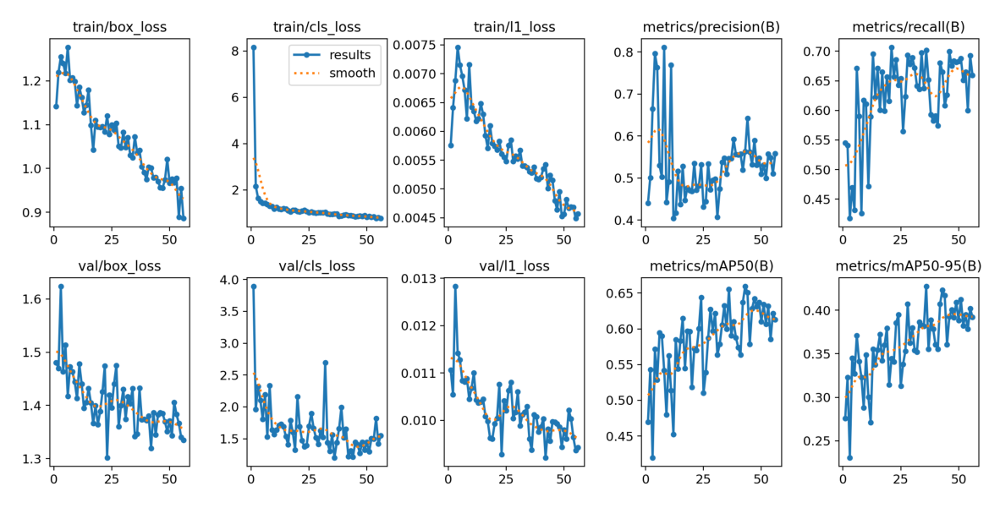

In [14]:
from PIL import Image
import matplotlib.pyplot as plt

baseline_run = Path(
    "/kaggle/working/runs/"
    "FINAL_yolo26s_baseline"
)

img = Image.open(
    baseline_run / "results.png"
)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.axis("off")
plt.show()

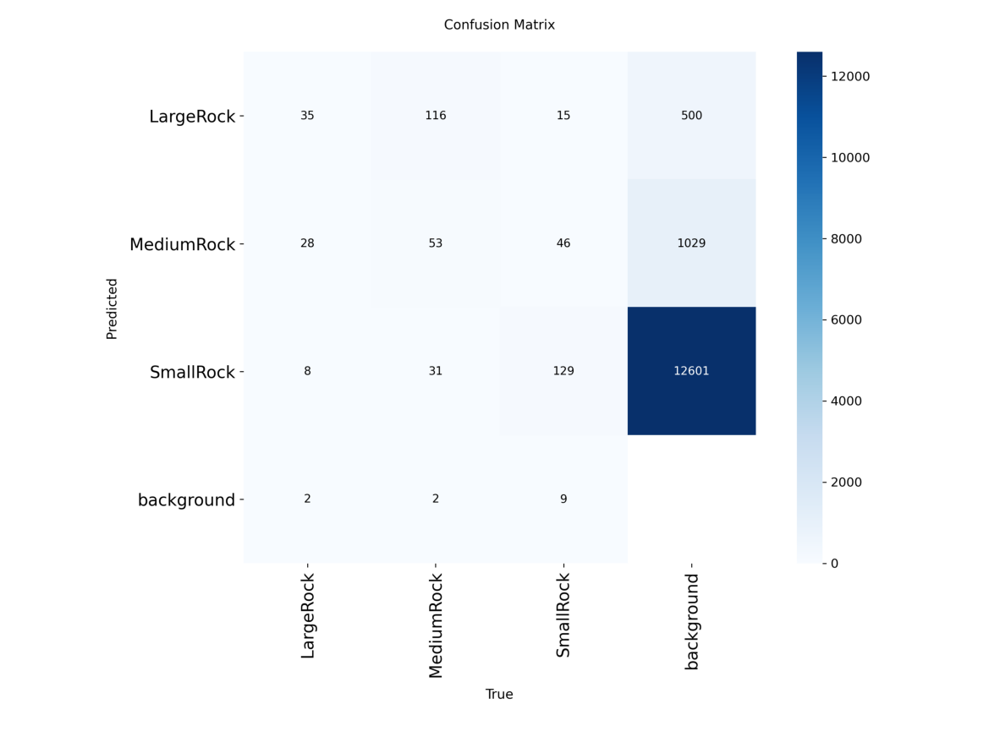

In [15]:
img = Image.open(
    baseline_run /
    "confusion_matrix.png"
)

plt.figure(figsize=(15, 15))
plt.imshow(img)
plt.axis("off")
plt.show()

In [16]:
baseline_best = YOLO(
    str(
        baseline_run /
        "weights/best.pt"
    )
)

baseline_val = baseline_best.val(
    data=str(FINAL_YAML),

    split="val",

    imgsz=640,
    batch=16,
    device=0,

    plots=True,

    project="/kaggle/working/runs",
    name="VAL_yolo26s_baseline"
)

Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLO26s summary (fused): 122 layers, 9,466,341 parameters, 0 gradients, 20.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3996.9±279.5 MB/s, size: 7361.6 KB)
val: Scanning /kaggle/working/rock_dataset_clean/valid/labels.cache... 268 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 268/268 102.2Mit/s 0.0s
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_080512_jpg.rf.0jRWAfNBAfivoPM3eZ9a.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_080532_jpg.rf.1anD07wRH8U6YxN7Zxb2.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_094617_jpg.rf.C41xPqFT9VBgI65Ctue8.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_094747_jpg.rf.9Thowu40WIbWf4MCaRhA.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/202505

In [17]:
rotation_model = YOLO(
    "yolo26s.pt"
)

rotation_results = rotation_model.train(
    data=str(FINAL_YAML),

    imgsz=640,
    epochs=100,
    batch=16,
    device=0,

    workers=8,
    patience=20,

    seed=0,
    deterministic=True,

    project="/kaggle/working/runs",

    name="FINAL_yolo26s_rotation",

    exist_ok=False,

    save=True,
    plots=True,
    
    degrees=180.0,translate=0.10,scale=0.30,shear=5.0,perspective=0.0005,fliplr=0.5,flipud=0.5)

New https://pypi.org/project/ultralytics/8.4.129 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/rock_size_data.yaml, degrees=180.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, 

In [18]:
rotation_run = Path(
    "/kaggle/working/runs/"
    "FINAL_yolo26s_rotation"
)

rotation_best = YOLO(
    str(
        rotation_run /
        "weights/best.pt"
    )
)

rotation_val = rotation_best.val(
    data=str(FINAL_YAML),

    split="val",

    imgsz=640,
    batch=16,
    device=0,

    plots=True,

    project="/kaggle/working/runs",

    name="VAL_yolo26s_rotation"
)

Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLO26s summary (fused): 122 layers, 9,466,341 parameters, 0 gradients, 20.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4448.7±720.8 MB/s, size: 4873.9 KB)
val: Scanning /kaggle/working/rock_dataset_clean/valid/labels.cache... 268 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 268/268 102.2Mit/s 0.0s
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_080512_jpg.rf.0jRWAfNBAfivoPM3eZ9a.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_080532_jpg.rf.1anD07wRH8U6YxN7Zxb2.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_094617_jpg.rf.C41xPqFT9VBgI65Ctue8.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_094747_jpg.rf.9Thowu40WIbWf4MCaRhA.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/202505

Selected: /kaggle/working/rock_dataset_clean/valid/images/ChatGPT Image 2026年6月20日 18_13_54 (9)_png.rf.977Nigdw354NG2b2PHfu.png


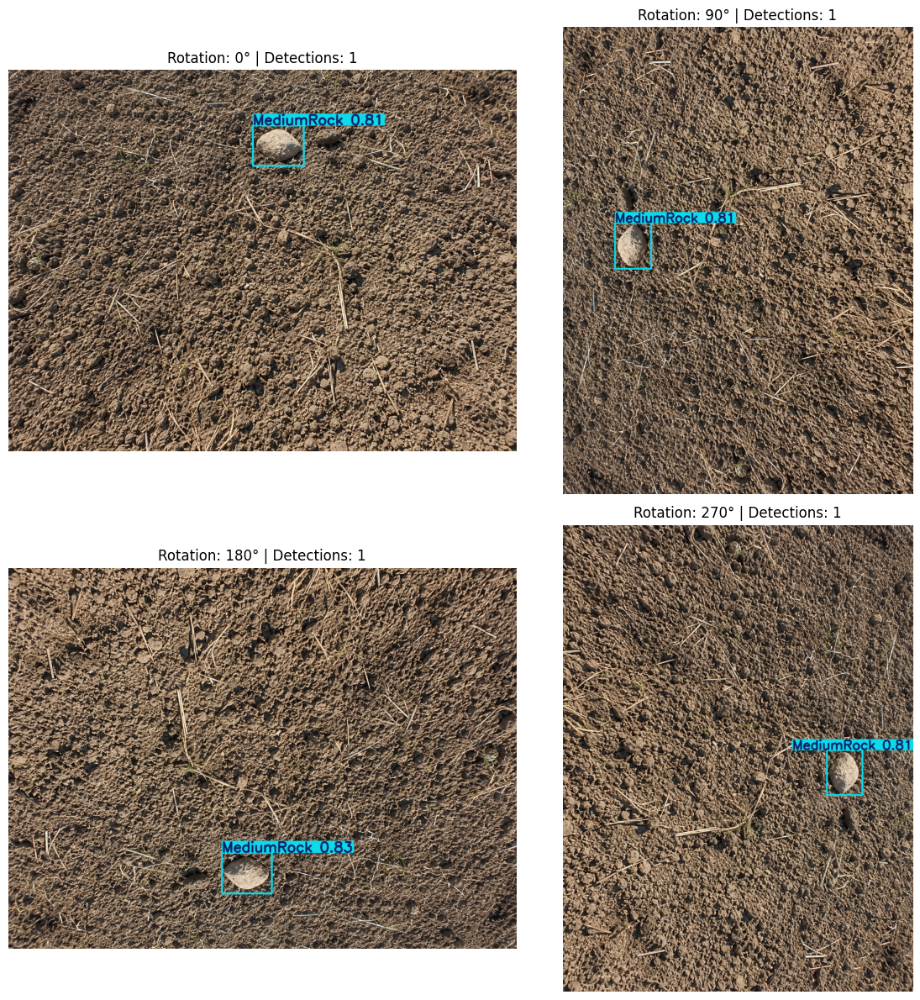

In [19]:
import random
import matplotlib.pyplot as plt
from PIL import Image

valid_images_dir = (
    WORK_DATASET /
    "valid/images"
)

valid_images = [
    p for p in valid_images_dir.iterdir()
    if p.suffix.lower() in IMAGE_EXTS
]

random.seed(0)

img_path = random.choice(
    valid_images
)

print("Selected:", img_path)

img = Image.open(
    img_path
).convert("RGB")

angles = [
    0,
    90,
    180,
    270
]

plt.figure(
    figsize=(12, 12)
)

for i, angle in enumerate(angles):

    rotated = img.rotate(
        angle,
        expand=True
    )

    result = rotation_best.predict(
        source=rotated,

        conf=0.30,

        imgsz=640,

        verbose=False
    )[0]

    pred = (
        result.plot()[..., ::-1]
    )

    plt.subplot(
        2,
        2,
        i + 1
    )

    plt.imshow(pred)

    plt.title(
        f"Rotation: {angle}° | "
        f"Detections: "
        f"{len(result.boxes)}"
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [20]:
final_model = YOLO(
    "yolo26s.pt"
)

final_results = final_model.train(
    data=str(FINAL_YAML),

    imgsz=640,
    epochs=100,
    batch=16,
    device=0,

    workers=8,
    patience=20,

    seed=0,
    deterministic=True,

    project="/kaggle/working/runs",

    name=(
        "FINAL_yolo26s_"
        "rotation_background"
    ),

    exist_ok=False,

    save=True,
    plots=True,

    # Rotation
    degrees=180.0,

    fliplr=0.5,
    flipud=0.5,

    # Geometry
    translate=0.10,

    scale=0.25,

    shear=3.0,

    perspective=0.0,

    # Colour / lighting
    hsv_h=0.015,

    hsv_s=0.40,

    hsv_v=0.30,

    # Complex scene augmentation
    mosaic=0.8,

    mixup=0.05,

    close_mosaic=10
)

New https://pypi.org/project/ultralytics/8.4.129 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/rock_size_data.yaml, degrees=180.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.4, hsv_v=0.3, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.05,

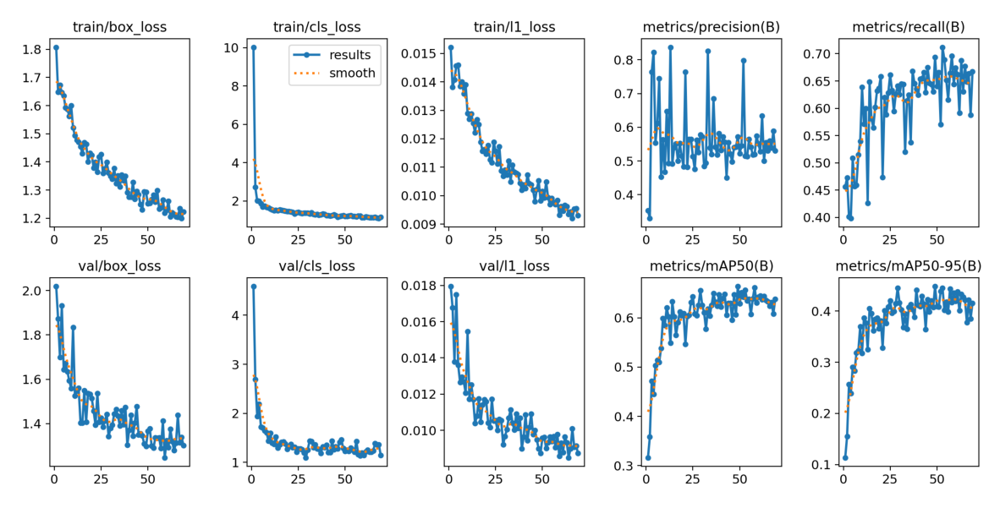

In [21]:
FINAL_RUN = Path(
    "/kaggle/working/runs/"
    "FINAL_yolo26s_"
    "rotation_background"
)

img = Image.open(
    FINAL_RUN / "results.png"
)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.axis("off")
plt.show()

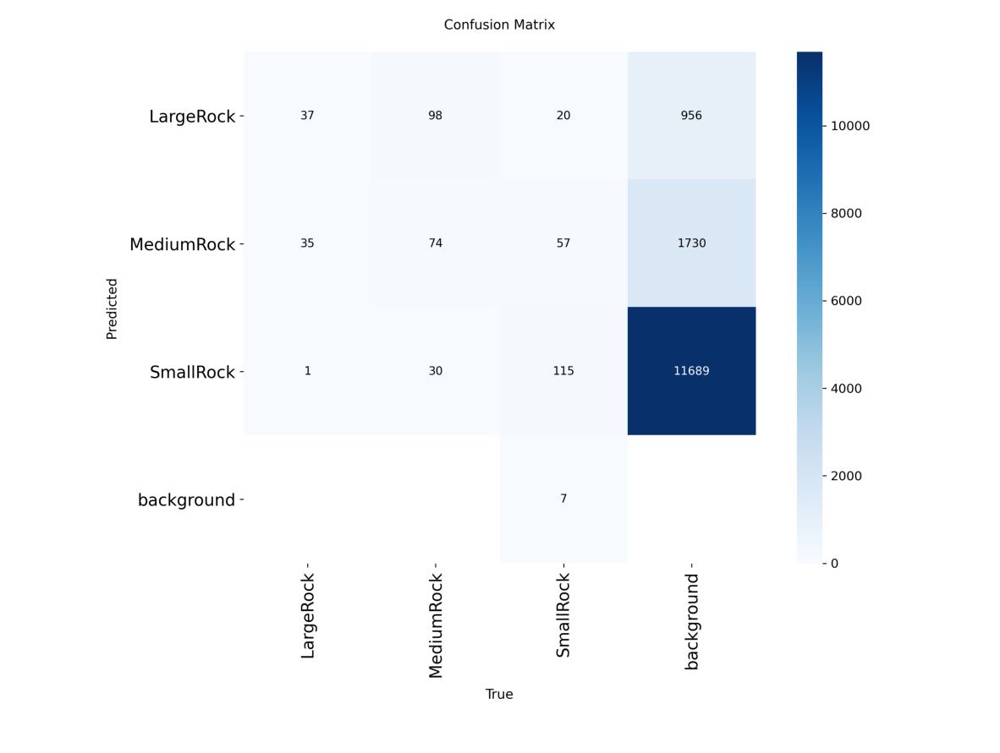

In [22]:
img = Image.open(
    FINAL_RUN /
    "confusion_matrix.png"
)

plt.figure(figsize=(15, 15))
plt.imshow(img)
plt.axis("off")
plt.show()

In [23]:
final_best = YOLO(
    str(
        FINAL_RUN /
        "weights/best.pt"
    )
)

final_val = final_best.val(
    data=str(FINAL_YAML),

    split="val",

    imgsz=640,
    batch=16,
    device=0,

    plots=True,

    project="/kaggle/working/runs",

    name="VAL_yolo26s_final"
)

print(
    final_val.results_dict
)

Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLO26s summary (fused): 122 layers, 9,466,341 parameters, 0 gradients, 20.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 5091.6±1087.6 MB/s, size: 4873.9 KB)
val: Scanning /kaggle/working/rock_dataset_clean/valid/labels.cache... 268 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 268/268 124.9Mit/s 0.0s
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_080512_jpg.rf.0jRWAfNBAfivoPM3eZ9a.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_080532_jpg.rf.1anD07wRH8U6YxN7Zxb2.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_094617_jpg.rf.C41xPqFT9VBgI65Ctue8.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250516_094747_jpg.rf.9Thowu40WIbWf4MCaRhA.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/valid/images/20250

In [24]:
print(
    "\nPer-class Validation:\n"
)

for class_id, class_name \
        in final_best.names.items():

    print(
        f"{class_name}: "
        f"P="
        f"{final_val.box.p[class_id]:.4f}, "
        f"R="
        f"{final_val.box.r[class_id]:.4f}, "
        f"mAP50="
        f"{final_val.box.ap50[class_id]:.4f}, "
        f"mAP50-95="
        f"{final_val.box.ap[class_id]:.4f}"
    )


Per-class Validation:

LargeRock: P=0.6787, R=0.7534, mAP50=0.7724, mAP50-95=0.6016
MediumRock: P=0.6931, R=0.9109, mAP50=0.9179, mAP50-95=0.5953
SmallRock: P=0.3264, R=0.4422, mAP50=0.3012, mAP50-95=0.1448


/tmp/ipykernel_23/752377535.py:55: UserWarning: Glyph 24180 (\N{CJK UNIFIED IDEOGRAPH-5E74}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_23/752377535.py:55: UserWarning: Glyph 26376 (\N{CJK UNIFIED IDEOGRAPH-6708}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_23/752377535.py:55: UserWarning: Glyph 26085 (\N{CJK UNIFIED IDEOGRAPH-65E5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_23/752377535.py:55: UserWarning: Glyph 19979 (\N{CJK UNIFIED IDEOGRAPH-4E0B}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_23/752377535.py:55: UserWarning: Glyph 21320 (\N{CJK UNIFIED IDEOGRAPH-5348}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 24180 (\N{CJK UNIFIED IDEOGRAPH-5E74}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/p

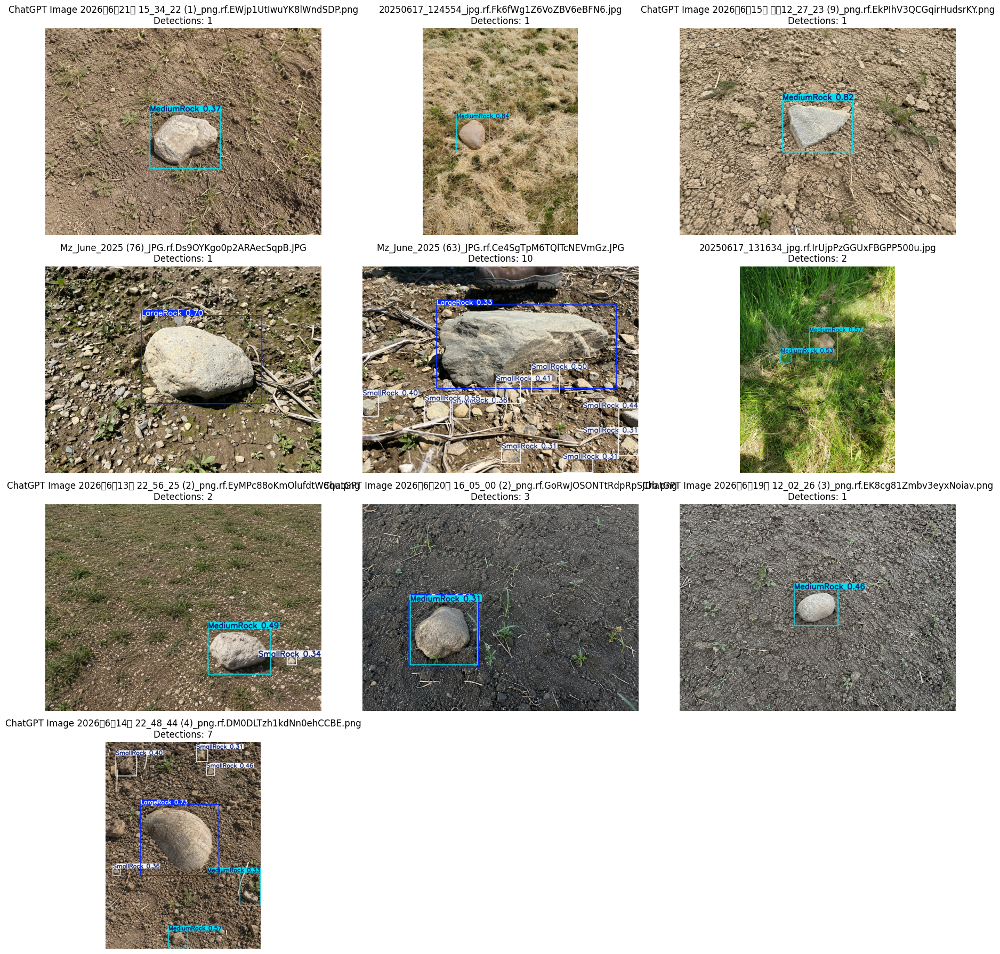

In [25]:
test_images_dir = (
    WORK_DATASET /
    "test/images"
)

test_images = [
    p for p in test_images_dir.iterdir()
    if p.suffix.lower() in IMAGE_EXTS
]

random.seed(0)

random_images = random.sample(
    test_images,
    min(10, len(test_images))
)

plt.figure(
    figsize=(18, 18)
)

for i, image_path \
        in enumerate(random_images):

    result = final_best.predict(
        source=str(image_path),

        imgsz=640,

        conf=0.30,

        verbose=False
    )[0]

    prediction = (
        result.plot()[..., ::-1]
    )

    plt.subplot(
        4,
        3,
        i + 1
    )

    plt.imshow(prediction)

    plt.axis("off")

    plt.title(
        f"{image_path.name}\n"
        f"Detections: "
        f"{len(result.boxes)}"
    )

plt.tight_layout()
plt.show()

In [26]:
test_metrics = final_best.val(
    data=str(FINAL_YAML),

    split="test",

    imgsz=640,

    batch=16,

    device=0,

    plots=True,

    project="/kaggle/working/runs",

    name="TEST_yolo26s_final"
)

print(
    "\nOverall TEST metrics:"
)

print(
    test_metrics.results_dict
)

Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 401.2±47.4 MB/s, size: 8840.6 KB)
val: Scanning /kaggle/working/rock_dataset_clean/test/labels... 132 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 132/132 17.3it/s 7.6s
val: /kaggle/working/rock_dataset_clean/test/images/20250516_094718_jpg.rf.Gd5rwqq5DXEr2PrXTwE7.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/test/images/20250516_094815_jpg.rf.D72t9889ePGZCbdW4s95.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/test/images/20250520_111713_jpg.rf.D3YbQZqiPhy0JGNgIsuL.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/test/images/20250520_115512_jpg.rf.GVyhQrl1abVHxSFJh3VR.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/test/images/20250520_140036_jpg.rf.F0n1zIj9yyvO0rSmyzYo.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock

In [27]:
print(
    "\nPer-class TEST results:\n"
)

for class_id, class_name \
        in final_best.names.items():

    print(
        f"{class_name}: "
        f"Precision="
        f"{test_metrics.box.p[class_id]:.4f}, "
        f"Recall="
        f"{test_metrics.box.r[class_id]:.4f}, "
        f"mAP50="
        f"{test_metrics.box.ap50[class_id]:.4f}, "
        f"mAP50-95="
        f"{test_metrics.box.ap[class_id]:.4f}"
    )


Per-class TEST results:

LargeRock: Precision=0.7404, Recall=0.7000, mAP50=0.6836, mAP50-95=0.5154
MediumRock: Precision=0.6802, Recall=0.8180, mAP50=0.8657, mAP50-95=0.6031
SmallRock: Precision=0.1812, Recall=0.3559, mAP50=0.1406, mAP50-95=0.0532


In [28]:
print(
    "Precision:",
    test_metrics.box.mp
)

print(
    "Recall:",
    test_metrics.box.mr
)

print(
    "mAP50:",
    test_metrics.box.map50
)

print(
    "mAP50-95:",
    test_metrics.box.map
)

Precision: 0.5339201166921491
Recall: 0.6246405008384568
mAP50: 0.5632781194062179
mAP50-95: 0.39057958247666136


In [29]:
best_path = (
    FINAL_RUN /
    "weights/best.pt"
)

print(
    "Best PT:",
    best_path
)

onnx_model = YOLO(
    str(best_path)
)

onnx_path = onnx_model.export(
    format="onnx",

    imgsz=640,

    batch=1,

    simplify=True
)

print(
    "ONNX:",
    onnx_path
)

Best PT: /kaggle/working/runs/FINAL_yolo26s_rotation_background/weights/best.pt
Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO26s summary (fused): 122 layers, 9,466,341 parameters, 0 gradients, 20.8 GFLOPs

PyTorch: starting from '/kaggle/working/runs/FINAL_yolo26s_rotation_background/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 300, 6) (19.4 MB)
requirements: Ultralytics requirements ['onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 274ms
 Downloaded onnxruntime
Prepared 2 packages in 322ms
Installed 2 packages in 15ms
 + onnxruntime==1.29.0
 + onnxslim==0.1.96

requirements: AutoUpdate success ✅ 1.4s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take ef

In [30]:
pt_path = Path(
    FINAL_RUN /
    "weights/best.pt"
)

onnx_path = Path(
    FINAL_RUN /
    "weights/best.onnx"
)

pt_size = (
    pt_path.stat().st_size
    / 1024**2
)

onnx_size = (
    onnx_path.stat().st_size
    / 1024**2
)

print(
    f"PT: {pt_size:.2f} MB"
)

print(
    f"ONNX: {onnx_size:.2f} MB"
)

PT: 19.36 MB
ONNX: 36.40 MB


WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify', 'pose', 'obb' or 'semantic'.
Loading /kaggle/working/runs/FINAL_yolo26s_rotation_background/weights/best.onnx for ONNX Runtime inference...
Using ONNX Runtime 1.29.0 with CPUExecutionProvider


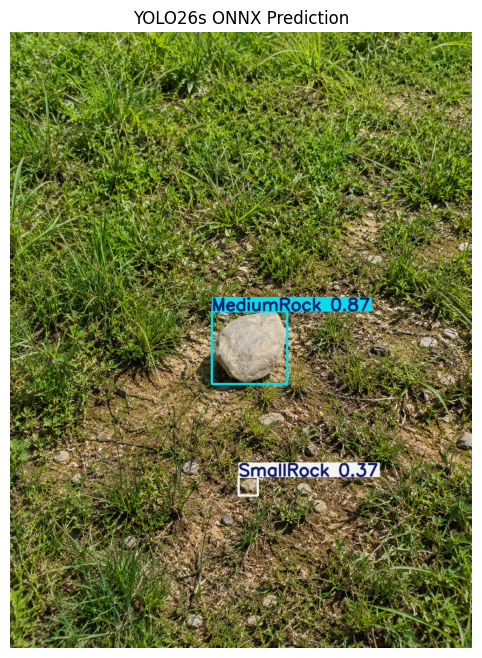

In [31]:
onnx_detector = YOLO(
    str(onnx_path)
)

sample = random.choice(
    test_images
)

result = onnx_detector.predict(
    source=str(sample),

    imgsz=640,

    conf=0.30,

    device="cpu",

    verbose=False
)[0]

prediction = (
    result.plot()[..., ::-1]
)

plt.figure(figsize=(10, 8))
plt.imshow(prediction)
plt.axis("off")
plt.title(
    "YOLO26s ONNX Prediction"
)
plt.show()

In [32]:
onnx_test = onnx_detector.val(
    data=str(FINAL_YAML),

    split="test",

    imgsz=640,

    batch=1,

    device="cpu"
)

print(
    "ONNX Precision:",
    onnx_test.box.mp
)

print(
    "ONNX Recall:",
    onnx_test.box.mr
)

print(
    "ONNX mAP50:",
    onnx_test.box.map50
)

print(
    "ONNX mAP50-95:",
    onnx_test.box.map
)

Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
Loading /kaggle/working/runs/FINAL_yolo26s_rotation_background/weights/best.onnx for ONNX Runtime inference...
Using ONNX Runtime 1.29.0 with CPUExecutionProvider
Setting batch=1 input of shape (1, 3, 640, 640)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2757.7±1099.9 MB/s, size: 11946.1 KB)
val: Scanning /kaggle/working/rock_dataset_clean/test/labels.cache... 132 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 132/132 39.5Mit/s 0.0s
val: /kaggle/working/rock_dataset_clean/test/images/20250516_094718_jpg.rf.Gd5rwqq5DXEr2PrXTwE7.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/test/images/20250516_094815_jpg.rf.D72t9889ePGZCbdW4s95.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/test/images/20250520_111713_jpg.rf.D3YbQZqiPhy0JGNgIsuL.jpg: corrupt JPEG restored and saved
val: /kaggle/working/rock_dataset_clean/test/images/20250520_11551

In [33]:
import time
import numpy as np

benchmark_images = (
    test_images[:50]
)

# Warm-up
for image_path in benchmark_images[:5]:

    onnx_detector.predict(
        source=str(image_path),
        imgsz=640,
        conf=0.30,
        device="cpu",
        verbose=False
    )

times = []

for image_path in benchmark_images:

    start = time.perf_counter()

    onnx_detector.predict(
        source=str(image_path),
        imgsz=640,
        conf=0.30,
        device="cpu",
        verbose=False
    )

    end = time.perf_counter()

    times.append(
        end - start
    )

avg_time = np.mean(times)

fps = 1 / avg_time

print(
    f"Average CPU latency: "
    f"{avg_time * 1000:.2f} ms/image"
)

print(
    f"FPS: {fps:.2f}"
)

Average CPU latency: 230.21 ms/image
FPS: 4.34
